# Tutorial on visualization of Neural Networks

This exercise aims at exploring different ways of visualizing Neural Networks:
- t-SNE of representations (CIFAR10)
- grad-CAM (ImageNet)
- activation maximization (ImageNet)

First, some preliminaries that facilitate plotting and data access on Google drive ... just execute !

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from matplotlib.colors import ListedColormap

plt.rcParams['figure.figsize'] = (20.0, 20.0)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

%matplotlib inline

import importlib.util
import sys

In [2]:
!pip install pytorch_lightning --quiet
!pip install transformers==4.46.1 --quiet


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 832.4/832.4 kB 26.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 43.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 1.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.0/10.0 MB 54.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 44.9 MB/s eta 0:00:00


In [3]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"

# Visualization of the encodings by t-SNE

First, we will visualize encodings of a network trained on the CIFAR data set. Here, we import and preprocess the data. We keep the original labels in `y_data` (to be used for visualization later on). For training, we need to transform them to one-hot-vectors.

In [4]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader, random_split

# Load CIFAR-10 dataset
transform = transforms.Compose([
    transforms.ToTensor(),
    #transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # normalize to [-1, 1]
])

train_data = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
test_data = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)

# Separate training data into train and validation sets
train_size = 40000
val_size = len(train_data) - train_size
train_data, val_data = random_split(train_data, [train_size, val_size])

# Convert labels to one-hot encoding
def one_hot_encode(labels, num_classes=10):
    return torch.eye(num_classes)[labels]

# Load data into DataLoaders
train_loader = DataLoader(train_data, batch_size=64, shuffle=True)
val_loader = DataLoader(val_data, batch_size=64, shuffle=False)
test_loader = DataLoader(test_data, batch_size=64, shuffle=False)

100%|██████████| 170M/170M [00:03<00:00, 42.9MB/s]


We will first visualize the data.

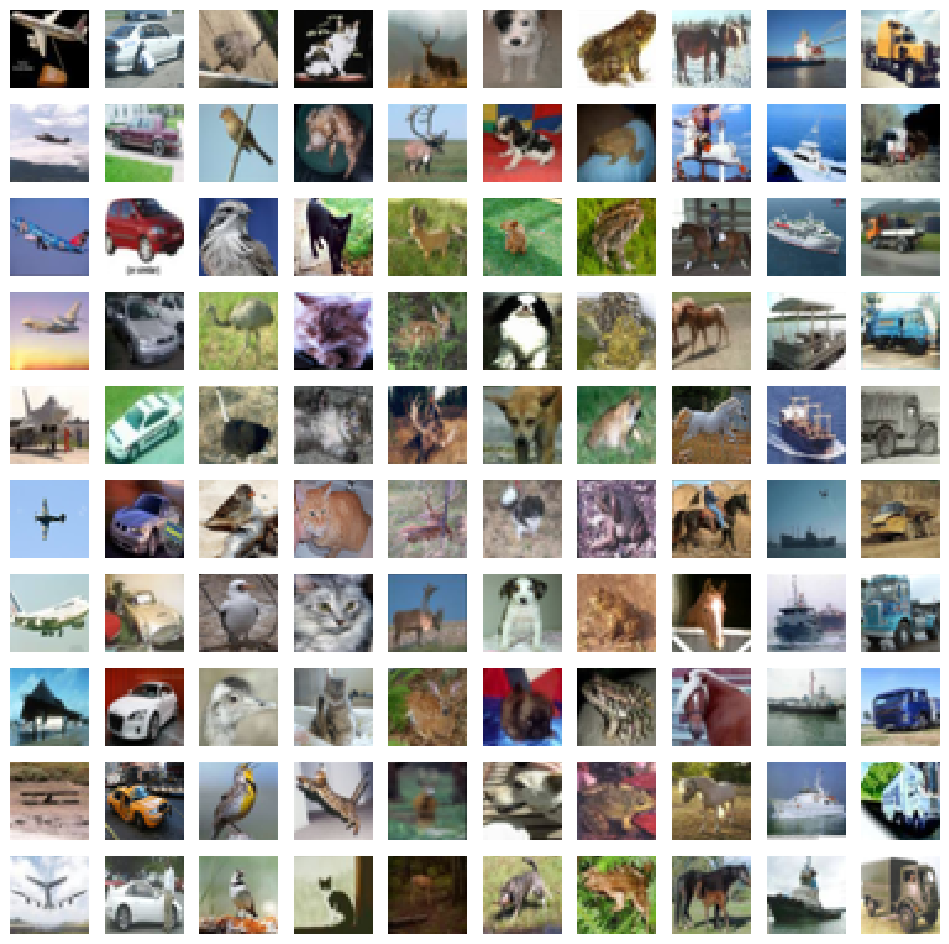

In [5]:
# helper function to plot a few images for each class
def plot_array(fig, dataset, classes_to_plot=None, samples_per_class=7):
    Y = dataset.targets
    if classes_to_plot is None:
        classes_to_plot = np.unique(Y)
    num_classes = len(classes_to_plot)

    for k, y in enumerate(classes_to_plot):
        idxs = np.flatnonzero(Y == y)
        idxs = np.random.choice(idxs, samples_per_class, replace=False)
        #print(y, idxs)

        for i, idx in enumerate(idxs):
            plt_idx = i * num_classes + k + 1
            ax = fig.add_subplot(samples_per_class, num_classes, plt_idx)
            image = dataset[idx][0].permute((1, 2, 0)) * 255
            ax.imshow(image.to(torch.uint8))
            ax.axis('off')
fig = plt.figure(figsize=(12, 12))
plot_array(fig, train_data.dataset, samples_per_class=10)

Next we define a neural network and train it on the data set. Here we use pytorch lightning to train the model using torch: https://lightning.ai/docs/pytorch/stable/starter/introduction.html

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import pytorch_lightning as pl
from torchmetrics import Accuracy


class CNNModel(nn.Sequential):
    def __init__(self, num_class=10):
        super(CNNModel, self).__init__()
        # Feature extractor
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(kernel_size=2),
            nn.Dropout(0.2),

            nn.AdaptiveAvgPool2d((1, 1)),  # Global average pooling
            nn.Flatten()
        )

        # Classifier
        self.classifier = nn.Sequential(
            nn.Linear(128, 128),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(128, num_class)  # Output layer for 10 classes
        )

    def forward(self, x):
      embeddings = self.features(x)
      logits = self.classifier(embeddings)
      return logits

    def forward_features(self, x):
      return self.features(x)


# Define the Lightning Module
class LightningClassifier(pl.LightningModule):
    def __init__(self, model, learning_rate=0.001):
        super(LightningClassifier, self).__init__()
        self.model = model
        self.loss_fn = nn.CrossEntropyLoss()
        self.accuracy = Accuracy(task="multiclass", num_classes=10)
        self.learning_rate = learning_rate

    def forward(self, x):
        return self.model(x)

    def training_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('train_loss', loss, prog_bar=True)
        self.log('train_acc', acc, prog_bar=True)
        return loss

    def validation_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('val_loss', loss, prog_bar=True)
        self.log('val_acc', acc, prog_bar=True)

    def test_step(self, batch, batch_idx):
        x, y = batch
        y_hat = self(x)
        loss = self.loss_fn(y_hat, y)
        acc = self.accuracy(y_hat.softmax(dim=-1), y)
        self.log('test_loss', loss)
        self.log('test_acc', acc)

    def predict_step(self, batch, batch_idx):
        x, y = batch
        return self.model.forward_features(x)

    def configure_optimizers(self):
        return optim.Adam(self.parameters(), lr=self.learning_rate)

# Instantiate the Lightning model
torch.cuda.empty_cache()
model = CNNModel()
ligthning_model = LightningClassifier(model, learning_rate=0.001)
ligthning_model.to(device)

LightningClassifier(
  (model): CNNModel(
    (features): Sequential(
      (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU()
      (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (5): ReLU()
      (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (7): Dropout(p=0.2, inplace=False)
      (8): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (9): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (10): ReLU()
      (11): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (12): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (13): ReLU()
      (14): MaxPool2d(kernel_size=2, stride=2, padding=0

In [7]:
import os
from pytorch_lightning.callbacks import ModelCheckpoint, LearningRateMonitor
from pytorch_lightning.loggers import TensorBoardLogger

# Train the model using the PyTorch Lightning Trainer
callbacks = [
    LearningRateMonitor(logging_interval="step"),
    ModelCheckpoint(
        dirpath=os.path.join("logs", "checkpoints"),
        filename="model",
        verbose=True,
        save_top_k=1,
        save_last=False,
        save_weights_only=True)]
logger = TensorBoardLogger("logs", name="classifier")

# where to store the best model (checkpoint)
best_checkpoint_path = os.path.join("logs", "checkpoints", "model.ckpt")

# trainer instantiation
trainer = pl.Trainer(
    max_epochs=10,
    callbacks=callbacks, logger=logger,
    accelerator="gpu" if device == "cuda" else "cpu",
    devices=1 if device == "cuda" else 0, # outside colab, you can increase the number of GPUs.
    gradient_clip_val=1., gradient_clip_algorithm="norm", # gradient clipping to improve stability
    precision="16" # half precision to speed up the training
    )

/usr/local/lib/python3.12/dist-packages/lightning_fabric/connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
INFO:pytorch_lightning.utilities.rank_zero:Using 16bit Automatic Mixed Precision (AMP)
INFO:pytorch_lightning.utilities.rank_zero:GPU available: True (cuda), used: True
INFO:pytorch_lightning.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO:pytorch_lightning.utilities.rank_zero:HPU available: False, using: 0 HPUs


In [8]:
# This is how to train a lightning model
trainer.fit(ligthning_model, train_loader, val_loader)

INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/model_summary/model_summary.py:231: Precision 16-mixed is not supported by the model summary.  Estimated model size in MB will not be accurate. Using 32 bits instead.
INFO:pytorch_lightning.callbacks.model_summary:
  | Name     | Type               | Params | Mode 
--------------------------------------------------------
0 | model    | CNNModel           | 305 K  | train
1 | loss_fn  | CrossEntropyLoss   | 0      | train
2 | accuracy | MulticlassAccuracy | 0      | train
--------------------------------------------------------
305 K     Trainable params
0         Non-trainable params
305 K     Total params
1.223     Total estimated model params size (MB)
35        Modules in train mode
0         Modules in eval mode


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO:pytorch_lightning.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=10` reached.


In [9]:
test_metrics = trainer.test(ligthning_model, test_loader, verbose=True, ckpt_path=best_checkpoint_path)

# to be sure that we loaded the best checkpoint
checkpoint = torch.load(best_checkpoint_path)
ligthning_model.load_state_dict(checkpoint["state_dict"], strict=True)

INFO:pytorch_lightning.utilities.rank_zero:Restoring states from the checkpoint path at logs/checkpoints/model.ckpt
INFO:pytorch_lightning.accelerators.cuda:LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO:pytorch_lightning.utilities.rank_zero:Loaded model weights from the checkpoint at logs/checkpoints/model.ckpt


Testing: |          | 0/? [00:00<?, ?it/s]

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃        Test metric        ┃       DataLoader 0        ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│         test_acc          │    0.8179000020027161     │
│         test_loss         │    0.5387470126152039     │
└───────────────────────────┴───────────────────────────┘

<All keys matched successfully>

In [11]:
%load_ext tensorboard
%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1639), started 0:08:36 ago. (Use '!kill 1639' to kill it.)

<IPython.core.display.Javascript object>

Now, that we trained the neural network, we observe training and validation error, and we try to get a solution that roughly obtains 80\% or more on the test set.

Now, we need to define a few plots ... just execute !

In [11]:
class_definition = {0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat',
                    4: 'deer', 5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship',
                    9: 'truck'}

from matplotlib.colors import to_hex

# definition of the scatterplot
def make_scatterplot(X, y, feature1=None, feature2=None,
                     class_indices=None, class_definition=None):
    if class_indices is None:
        class_indices = np.unique(y)
    if class_definition is None:
        class_definition = dict(zip(class_indices, [str(i) for i in class_indices]))
    if feature1 is None:
      feature1 = 'Component 1'
    if feature2 is None:
      feature2 = 'Component 2'

    # colors
    colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]

    fig = plt.figure(figsize = (8,8))
    ax = fig.add_subplot(1,1,1)
    ax.set_xlabel(feature1)
    ax.set_ylabel(feature2)
    ax.set_title('Scatter plot: %s vs. %s' % (feature2, feature1))

    comp1 = X[:,0]
    comp2 = X[:,1]
    for class_index in class_indices:
        class_label = class_definition[class_index]
        ax.scatter(comp1[y==class_index],
                   comp2[y==class_index],
                   c=to_hex(colors[class_index]),
                   label=class_label,
                   s=15)
    ax.legend()
    ax.grid()

Now, we will extract the features of a layer and visualize the distribution of the encodings with t-SNE.

First, we start with layer `flatten`. This is the last layer before the dense layers in the network.

In [13]:
model = ligthning_model.model.eval().to(device)


# features_upstream and features_downstream will hold the two feature
# vectors we are going to look at later.
features_upstream = []
features_downstream = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():

    # try to understand what is happening here.
    features_batch = model.features(x_batch.to(device))
    features_batch_ds = model.classifier[1](model.classifier[0](features_batch))

  features_upstream.append(features_batch.cpu())
  features_downstream.append(features_batch_ds.cpu())

# output --> vector
y = torch.hstack(y).numpy()

# we consider a subsample of the entire dataset
idxs_sampled = np.random.choice(np.arange(len(y)), 2000, replace=False)

# output subsampling
y = y[idxs_sampled]

# we choose whether to use features_upstream or features_downstream
features = torch.vstack(features_upstream).numpy()
features = features[idxs_sampled]


Finally, we perform t-SNE.

/tmp/ipython-input-3877127856.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


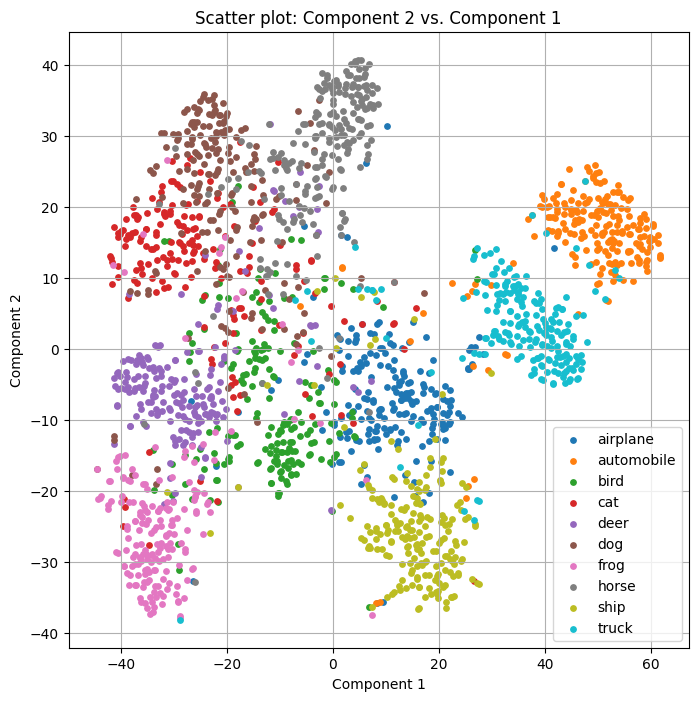

In [14]:
from sklearn.manifold import TSNE
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

**Assignment**: Explain what is a feature vector (hint: other terms in the literature are "Encodings", "Embeddings")

A feature vector is a numerical representation of an object like an image that captures its most important characteristics in a compact form.
In deep learning, feature vectors are sometimes called embeddings or encodings and they are usually learned automatically by neural networks. For example, when an image passes through a convolutional neural network, the early layers detect simple features like edges or colors, while deeper layers combine those into more abstract features like shapes or objects. The final output of these layers is a feature vector which is a set of numbers summarizing the image's content.
Each dimension of this vector represents some aspect of the data the model found important.

**Assignment**: Try out several perplexities: 5, 10, 30. What do you observe?

#### Perplexity = 5

/tmp/ipython-input-3877127856.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


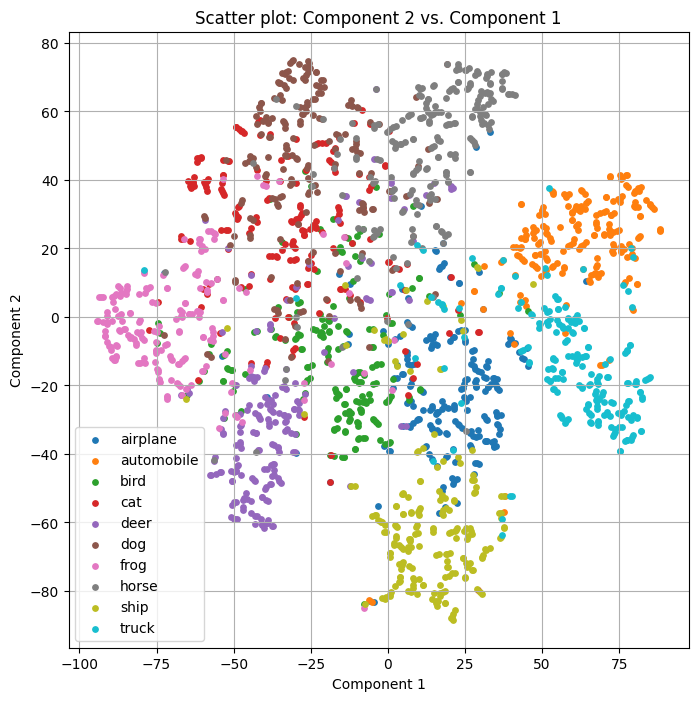

In [15]:
X_embedded = TSNE(n_components=2, perplexity=5).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

#### Perplexity = 10

/tmp/ipython-input-3877127856.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


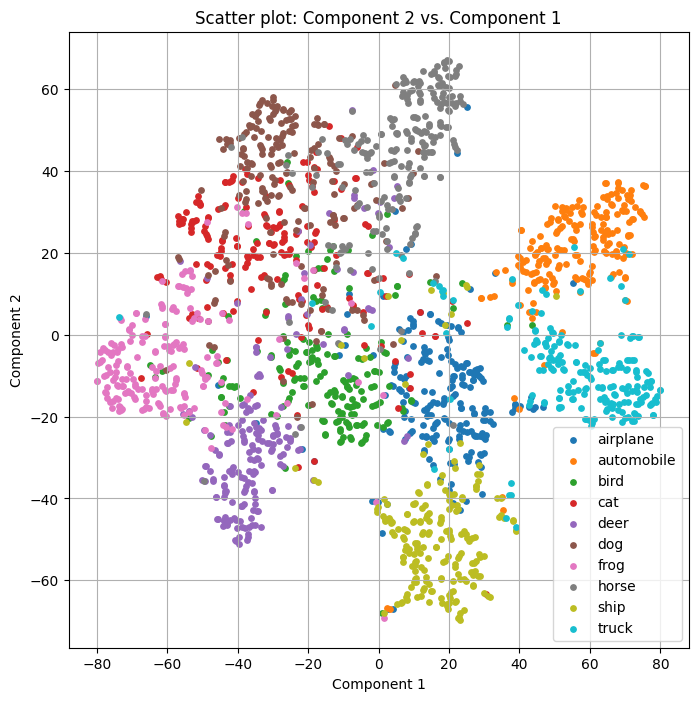

In [16]:
X_embedded = TSNE(n_components=2, perplexity=10).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

#### Perplexity = 30

/tmp/ipython-input-3877127856.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


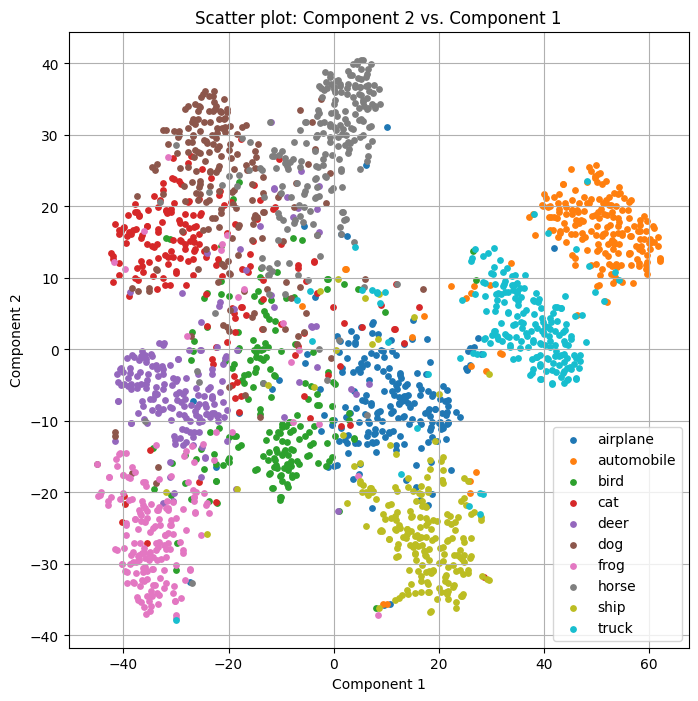

In [17]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

When we change the perplexity in t-SNE, we are adjusting how much each point cares about its nearby neighbors versus the overall distribution.

in perplexity = 5:
The plot looks more scattered and noisy. Each cluster is broken into many small sub groups, and the global arrangement is not very clear. This happens because a very low perplexity focuses too much on very small neighborhoods.

in perplexity = 10:
The clusters start to become clearer. Classes that belong together start to form to recognizable groups and it keeps some local detail.

in perplexity = 30:
The clusters are well-separated. The global structure of the dataset is easier to see and similar classes are close to each other and different classes are far apart. This has a good balance between local and global structure.

**Assignment**: Visualize now the embeddings at the two fully connected layers (in a different cell). Do you observe differences (albeit subtle)? Imagine you would like to use the same representations in another project (same image size, but other classes). Which of the representations seems more useful? Why?

In [19]:
model = ligthning_model.model.eval().to(device)


# features_upstream and features_downstream will hold the two feature
# vectors we are going to look at later.
features_downstream1 = []
features_downstream2 = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():

    # try to understand what is happening here.
    features_batch = model.features(x_batch.to(device))
    feature_batch_ds1 = model.classifier[0](features_batch)
    features_batch_ds2 = model.classifier[1](feature_batch_ds1)

  features_downstream1.append(feature_batch_ds1.cpu())
  features_downstream2.append(features_batch_ds2.cpu())

# output --> vector
y = torch.hstack(y).numpy()

# we consider a subsample of the entire dataset
idxs_sampled = np.random.choice(np.arange(len(y)), 2000, replace=False)

# output subsampling
y = y[idxs_sampled]

# we choose whether to use features_upstream or features_downstream
features1 = torch.vstack(features_downstream1).numpy()
features1 = features1[idxs_sampled]

features2 = torch.vstack(features_downstream2).numpy()
features2 = features2[idxs_sampled]

/tmp/ipython-input-3877127856.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


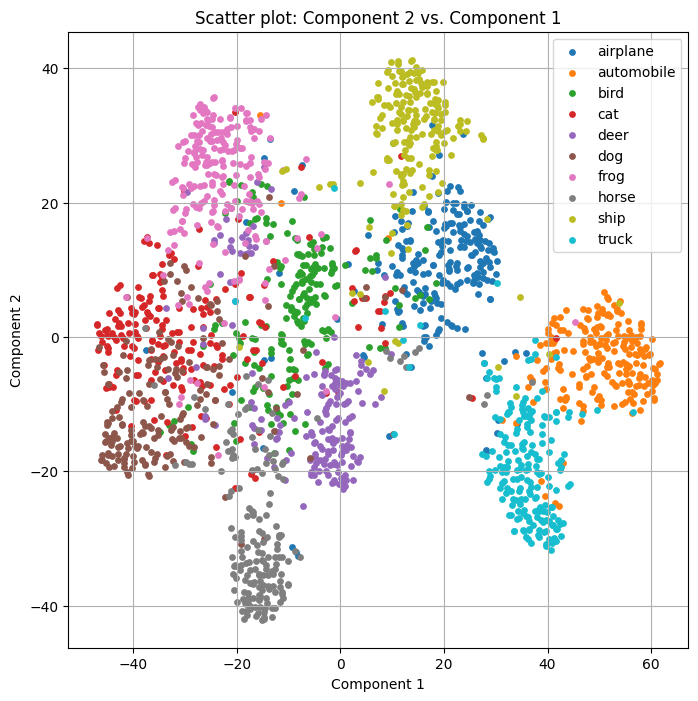

In [20]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features1)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

/tmp/ipython-input-3877127856.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


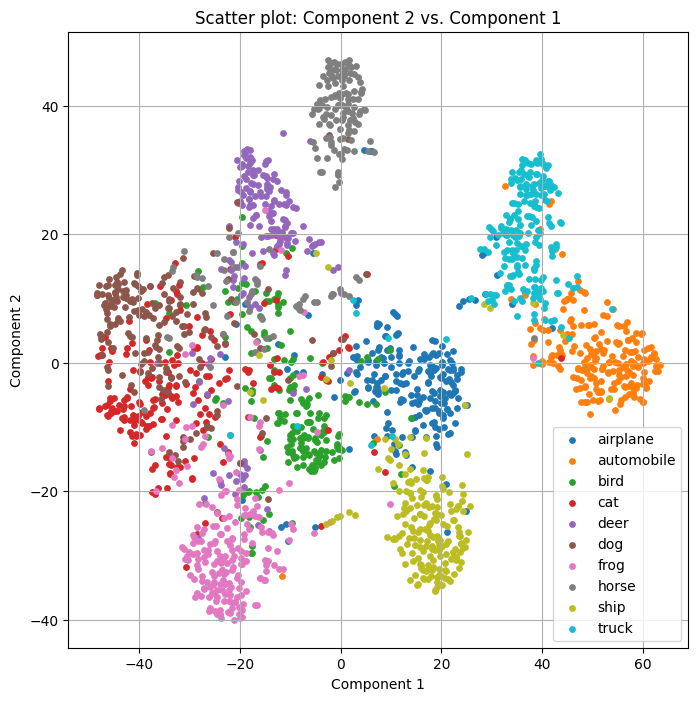

In [21]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features2)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

When I visualized the embeddings from the two fully connected layers, I can see that both show clear class clusters, but the structure of these clusters changes a little bit between the two.

In the first fully connected layer, the clusters are well-formed but not completely separated. Some classes overlap a little bit, especially those that look similar (like cats and dogs, or airplanes and birds and ships). This layer gets more general visual information that are useful for different types of objects.

In the second fully connected layer, the clusters become more distinct. The model converted the general features into class-specific patterns, which are optimized for the current task because this layer is responsible for making the final predictions.

If I wanted to reuse the learned representations for another project with the same image size but different classes, the first fully connected layer's embeddings would be more useful. They are more generic and transferable and it can capture general visual features instead of the precise decision specific to CIFAR-10.

**Assignment**: Visualize the tSNE plot of the untrained embeddings (model output before training). What do you observe?

In [22]:
untrained_model = CNNModel().eval().to(device)

# features_upstream and features_downstream will hold the two feature
# vectors we are going to look at later.
features_upstream = []
features_downstream = []
y = []
for data in val_loader:
  x_batch, y_batch = data
  y.append(y_batch)
  with torch.no_grad():

    # try to understand what is happening here.
    features_batch = untrained_model.features(x_batch.to(device))
    features_batch_ds = untrained_model.classifier[1](untrained_model.classifier[0](features_batch))

  features_upstream.append(features_batch.cpu())
  features_downstream.append(features_batch_ds.cpu())

# output --> vector
y = torch.hstack(y).numpy()

# we consider a subsample of the entire dataset
idxs_sampled = np.random.choice(np.arange(len(y)), 2000, replace=False)

# output subsampling
y = y[idxs_sampled]

# we choose whether to use features_upstream or features_downstream
features = torch.vstack(features_upstream).numpy()
features = features[idxs_sampled]


/tmp/ipython-input-3877127856.py:20: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  colors = plt.cm.get_cmap('tab10', 10).colors[:,:3]


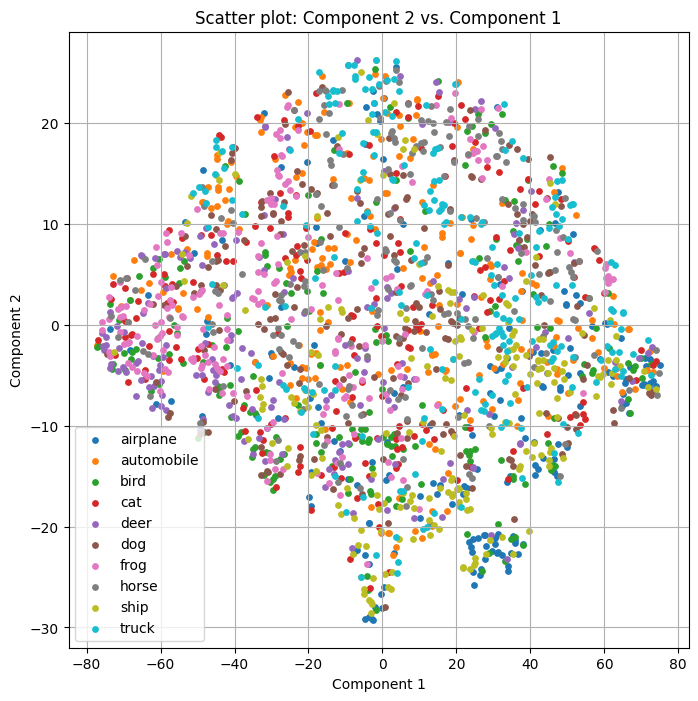

In [23]:
X_embedded = TSNE(n_components=2, perplexity=30).fit_transform(features)
make_scatterplot(X_embedded, y.flatten(), class_definition=class_definition)

When I visualized the t-SNE plot of the untrained embeddings, I understood that the points are scattered randomly and they have no structure by each class. The samples are mixed together and all overlap in the same space.

It happened because the model's weights are randomly initialized and the model didn't learn to extract meaningful patterns or features from the images, so the embeddings has no semantic information. The model did not learn how to separate the classes in its feature space.

After training, these random embeddings organize into clear clusters, showing that the model has learned to group similar images together.

# Classification activation maps (grad-CAM)

Classification activation maps provide certainly the most popular visualization methods for network inspection.

In [1]:
import torch
import matplotlib.pyplot as plt

device = "cuda" if torch.cuda.is_available() else "cpu"

In [2]:
!pip install gdown
!gdown --id 1-ypc0JK1Hp4d3dfO6eq0mPcx669PthXw --output /content/imagenet.zip
!unzip -q /content/imagenet.zip
!rm /content/imagenet.zip

/usr/local/lib/python3.12/dist-packages/gdown/__main__.py:140: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  warnings.warn(
Downloading...
From: https://drive.google.com/uc?id=1-ypc0JK1Hp4d3dfO6eq0mPcx669PthXw
To: /content/imagenet.zip
100% 1.72M/1.72M [00:00<00:00, 12.8MB/s]
replace imagenet/bridge1.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: A


In [3]:
!pip install torchcam

Next, we will load VGG16, pretrained on `ImageNet`. This is the network we are going to investigate.

In [4]:
from torchvision import models
import torch.nn.functional as F

torch.cuda.empty_cache()
model = models.vgg16(weights=models.VGG16_Weights.IMAGENET1K_V1)
model = model.eval().to(device)

labels_names = models.VGG16_Weights.IMAGENET1K_V1.meta["categories"]

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


100%|██████████| 528M/528M [00:08<00:00, 68.7MB/s]


Now, we load an image from the `ImageNet` data base. We have downloaded these images: they are in the folder `imagenet`.

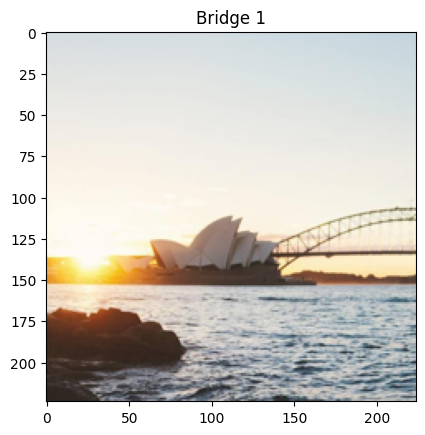

In [5]:
import os
from PIL import Image

filename = 'bridge1.jpg'
folder_name = '/content/imagenet'

# animals:
# bird : filename = '418657219_3567961db1.jpg'
# dog : filename = '425248370_b15374000e.jpg'
# bird : filename = '485627874_8f4144223a.jpg'

# bridges:
# filename = 'bridge1.jpg'
# filename = 'bridge2.jpg'
# filename = 'bridge3.jpg'

image = Image.open(os.path.join(folder_name, filename)).resize((224, 224))
plt.title('Bridge 1')
plt.imshow(image)


Now, we will predict the label of the image.

In [6]:
from torchvision import transforms


preprocess = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])  # Normalize to match ImageNet
])

img_prep = preprocess(image)
img_prep = img_prep.unsqueeze(0)

with torch.no_grad():
    img_prediction = model(img_prep.to(device))

# Get probabilities by applying softmax to the output
probs = F.softmax(img_prediction, dim=1)

# Convert the probabilities to a numpy array and get the top 3 predictions
top_probs, top_indices = torch.topk(probs, 3, dim=1)
top_probs = top_probs.squeeze().cpu().numpy()
top_indices = top_indices.squeeze().cpu().numpy()

for i in range(3):
    label = labels_names[top_indices[i]]
    print(f"{label} ({top_indices[i]}): {top_probs[i] * 100:.2f}%")

# Get the solution index with the maximum probability
max_index = top_indices[0]
print('Predicted Index:', max_index)

schooner (780): 27.15%
pier (718): 10.60%
wreck (913): 9.71%
Predicted Index: 780


We will use the [Grad-Cam++](https://arxiv.org/pdf/1710.11063) implementation from torch-cam https://github.com/frgfm/torch-cam

Note that the output of the model needs to be the the logits and not probabilities (default behaviour in torchvision mdeols). The reason is that with `softmax` we cannot study the influence of neurons on the output $y_k$, if the output depends on all classes (which is the case when we use `softmax`).

780


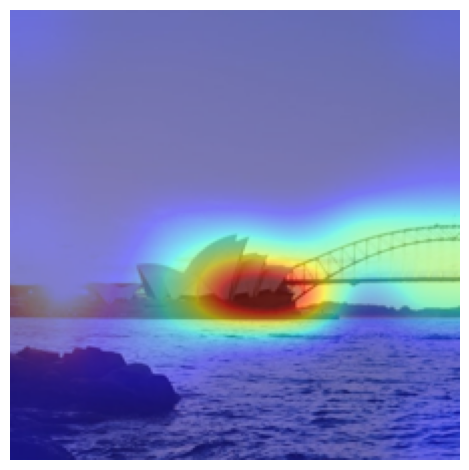

718


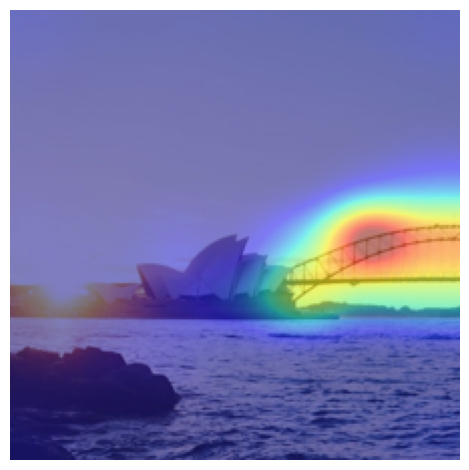

913


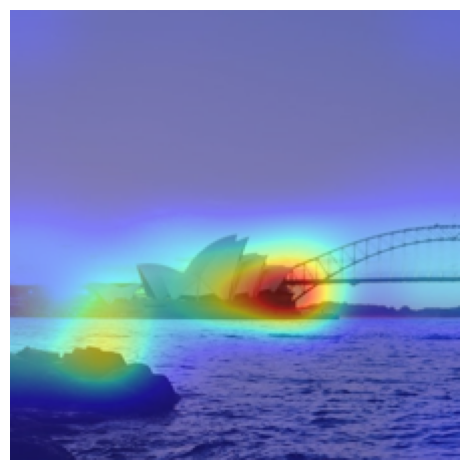

In [7]:
from torchcam.methods import GradCAMpp
from torchcam.utils import overlay_mask
from torchvision.transforms.functional import to_pil_image

n=3

img_prep = preprocess(image)
img_prep = img_prep.unsqueeze(0)

for k in range(n):
  with GradCAMpp(model) as cam_extractor:
      # Preprocess your data and feed it to the model
      out = model(img_prep.to(device))
      # Retrieve the CAM by passing the class index and the model output
      indices = out.squeeze(0).topk(n).indices
      print(int(indices[k]))
      activation_map = cam_extractor(int(indices[k]), out)

      # Resize the CAM and overlay it
      result = overlay_mask(image, to_pil_image(activation_map[0].squeeze(0), mode='F'), alpha=0.5)
      # Display it
      plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

**Assignment:** Test the grad-CAM first on the three animal images, and verify that you obtain a reasonable result. Then test the algorithm on the three bridge images. Visualize the top-3 predictions.(Make a nice plot with the results)

*   For `Bridge1.jpg` you obtain a wrong classification, but what can be said about the learned network in view of the visualization of the top-3 predictions?
*   For `Bridge2.jpg` you get the right result, but what can you say about the "understanding" of the image in view of your visualization result?

Note that the correspondence of class names and indices can be found at:
[ImageNet](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)


In [9]:
def cam_topk_for_image_pil(image_pil, topk=3):
    """Return (labels, probs, overlays) for the Top-k classes of a single PIL image."""
    img_prep = preprocess(image_pil).unsqueeze(0).to(device)

    # logits for CAM probs only for display
    with torch.no_grad():
        logits = model(img_prep)
        probs  = F.softmax(logits, dim=1)

    top_probs, top_indices = torch.topk(probs, topk, dim=1)
    top_probs  = top_probs.squeeze(0).detach().cpu().numpy()
    top_indices = top_indices.squeeze(0).detach().cpu().numpy()

    overlays = []
    # Set the correct target layer (last conv of VGG16)
    with GradCAMpp(model, target_layer=model.features[28]) as cam_extractor:
        for cls_idx in top_indices:
            out = model(img_prep)
            activation_map = cam_extractor(int(cls_idx), out)
            cam_pil = to_pil_image(activation_map[0].squeeze(0), mode='F')
            overlay = overlay_mask(image_pil, cam_pil, alpha=0.5)
            overlays.append(overlay)

    labels = [labels_names[i] for i in top_indices]
    return labels, top_probs, overlays

def show_category_top3_cams(file_list, category_name, folder=folder_name, img_size=(224, 224)):
    """
    For each file in file_list, plots Top-1, Top-2, Top-3.
    Layout: rows = #images, cols = 3 (one per prediction).
    """
    rows, cols = len(file_list), 3
    fig, axes = plt.subplots(rows, cols, figsize=(4.5*cols, 3.6*rows))
    if rows == 1:
        axes = np.array([axes])

    for r, fname in enumerate(file_list):
        image = Image.open(os.path.join(folder, fname)).convert("RGB").resize(img_size)
        labels, probs, overlays = cam_topk_for_image_pil(image, topk=3)

        for c in range(3):
            ax = axes[r, c]
            ax.imshow(overlays[c])  # one overlay per prediction
            ax.axis('off')
            file_tag = fname if c == 0 else ""
            ax.set_title(f"{file_tag}\nTop-{c+1}: {labels[c]} ({probs[c]*100:.1f}%)", fontsize=10)

    plt.suptitle(category_name, y=1.02, fontsize=12)
    plt.tight_layout()
    plt.show()

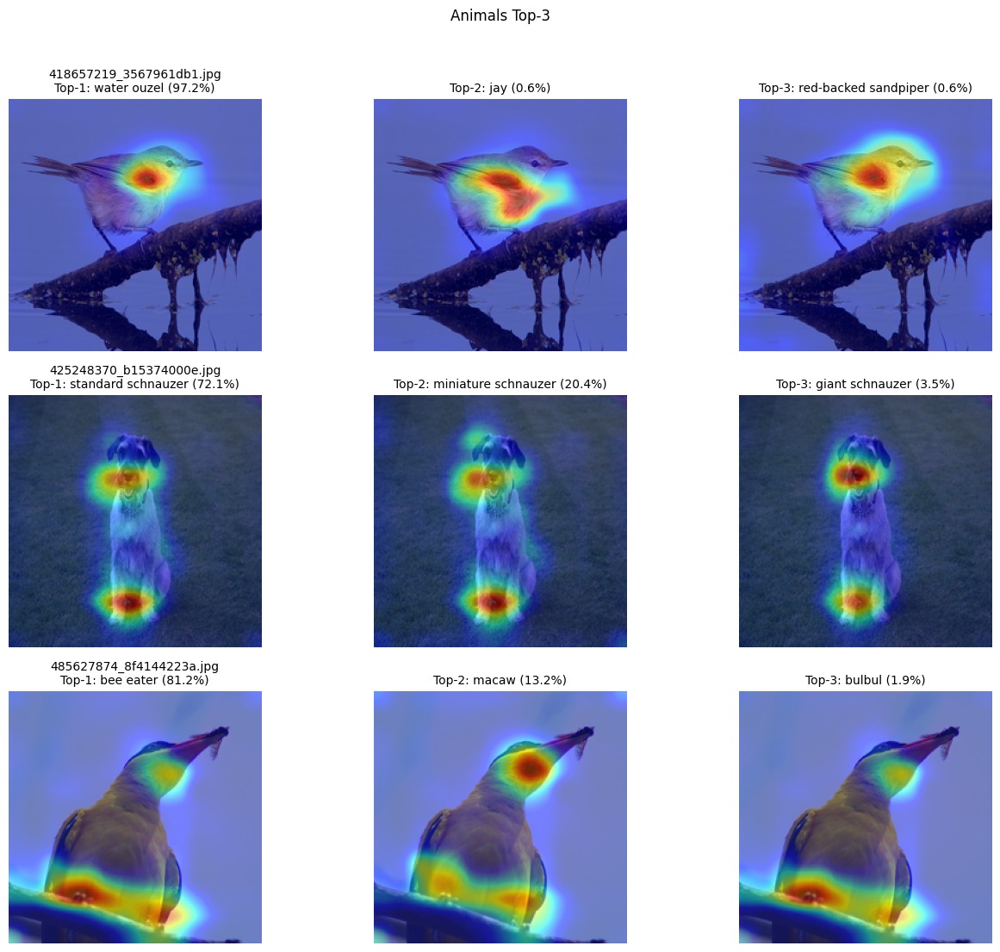

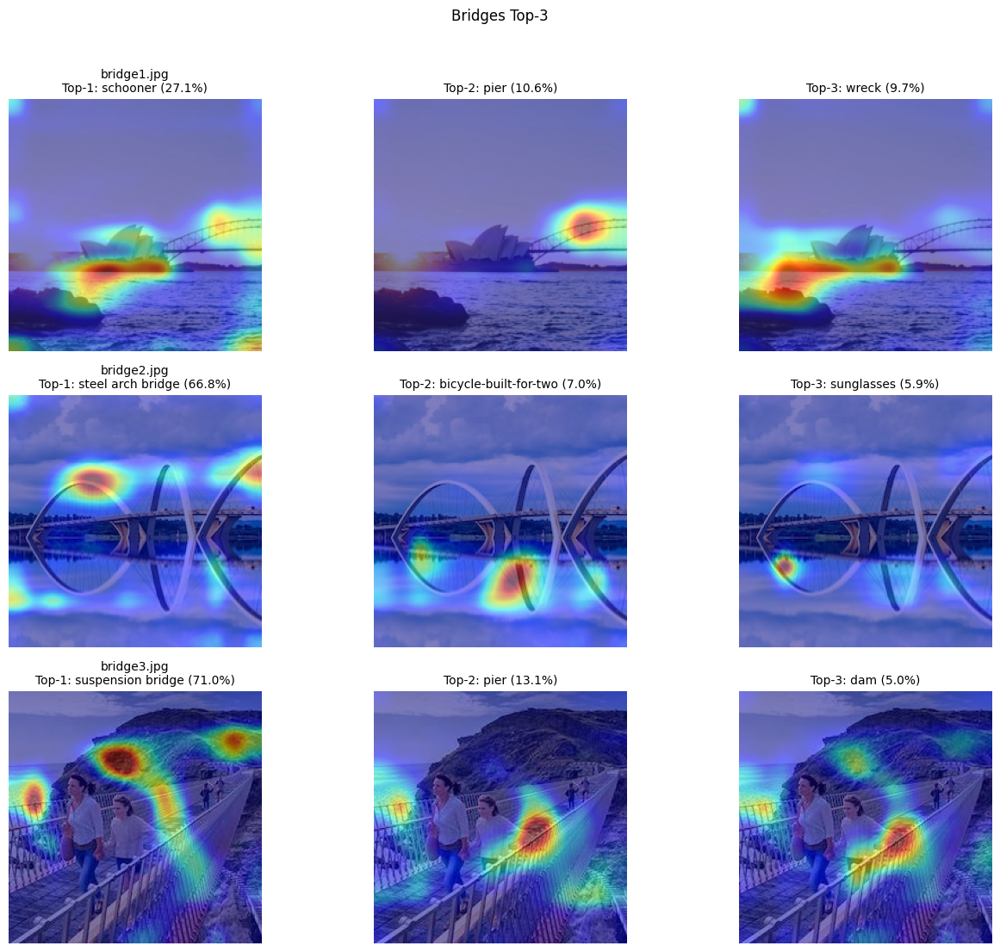

In [10]:
animal_files = [
    '418657219_3567961db1.jpg',  # bird
    '425248370_b15374000e.jpg',  # dog
    '485627874_8f4144223a.jpg',  # bird
]
show_category_top3_cams(animal_files, "Animals Top-3")
bridge_files = ['bridge1.jpg', 'bridge2.jpg', 'bridge3.jpg']
show_category_top3_cams(bridge_files, "Bridges Top-3")

## Animals

The Grad-CAM results for the three animal images look reasonable.
For the bird examples, the model mainly focuses on the head, wings, and chest which makes sense because these parts contain the most distinctive features for identifying birds.
In the dog image, the highlighted regions are mostly around the face and legs where help separate dog breeds.
This shows that the pretrained VGG16 has learned meaningful features. The areas it highlights match the animals well, which means the Grad-CAM visualizations are behaving as we would expect for correct classifications.

## Bridges

For the bridge images, the model's behavior is mixed.

Bridge1:
The model predicts the wrong class (schooner), but the Grad-CAM still focus on the bridge structure and parts of the water. This means the network is looking at the right regions of the image which are the bridge and the water underneath but it seems to confuse the whole scene because of the boat-like object and the presence of water. For other top predictions the model looks at the correct regions of the image, too. That happens mainly because of the presence of multiple objects in an image. So even though the final label is incorrect, the visualization suggests that the model has learned some meaningful visual features, just not precise enough to separate similar-looking categories.

Bridge2:
In this image the model correctly classifies the image as a steel arch bridge. The activations highlight the curved arches and the reflection in the water, which are the key features of this type of bridge. But I also noticed that some attention goes to the reflections and sky, showing that the model's reasoning is mostly based on visual patterns and it did not understand the object. So the answer is right but for the wrong reasons.

Bridge3:
For this one, the model again predicts correctly (suspension bridge), and the highlighted regions align with the bridge's cables and towers which are exactly the features that define a suspension bridge. This shows that, in this image the model is attending to the right structural elements.

# Activation Maximization

So far, we visualized activations of images, i.e. we focused on visualizations of inner network representations for given image data.

We can also visualize properties of the network itself. A popular method is the activation maximization, where we seek an image that would maximize a given neuron inside the network.

For this, we solve the maximization problem:
\begin{equation}
x^{\ast} = {\arg \max}_{x} z(x)
\end{equation}
where $z(x)$ is the value of an arbitrary neuron (or a set of neurons, e.g. the neurons in one feature map) in the network.

Typically, $z(x)=S_c(x)$ is the value of the output layer for one particular class. We therefore seek the image that maximizes the output for a particular class (e.g. the output for `water_ouzel`, `index: 20`).

More information here: https://distill.pub/2017/feature-visualization/

In [22]:
#@title Maximum activation visualization functions

# Inspired from  tf-keras-vis https://github.com/keisen/tf-keras-vis/blob/c793148ff6bc97d03880b107b958fb9c4f87efc5/tf_keras_vis/activation_maximization/__init__.py#L17

import torch.nn as nn
import numpy as np


class TotalVariation2D(nn.Module):
    """A regularizer that introduces Total Variation."""

    def __init__(self, weight=10.0, name='TotalVariation2D'):
        """
        Args:
            weight: This value will be applied to TotalVariation values.
                Defaults to 10.0.
            name : Instance name.
                Defaults to 'TotalVariation2D'.
        """
        super(TotalVariation2D, self).__init__()
        self.weight = float(weight)

    def forward(self, input_value):
        if len(input_value.shape) != 4:
            raise ValueError("Input shape must be (batch_size, channels, height, width), "
                             f"but was {input_value.shape}.")

        # Calculate total variation
        tv = torch.sum(torch.abs(input_value[:, :, 1:, :] - input_value[:, :, :-1, :])) + \
             torch.sum(torch.abs(input_value[:, :, :, 1:] - input_value[:, :, :, :-1]))

        # Normalize by the number of elements and apply weight
        tv /= float(input_value.shape[1] * input_value.shape[2] * input_value.shape[3])
        tv *= self.weight
        return tv


class Norm(nn.Module):
    """A regularizer that introduces Norm."""

    def __init__(self, weight=10.0, p=2, name='Norm'):
        """
        Args:
            weight: This weight will be applied to the norm values.
                Defaults to 10.
            p: Order of the norm. Defaults to 2.
            name: Instance name. Defaults to 'Norm'.
        """
        super(Norm, self).__init__()
        self.weight = float(weight)
        self.p = int(p)

    def forward(self, input_value):
        # Reshape to (batch_size, -1) for calculating norm
        reshaped_input = input_value.view(input_value.shape[0], -1)

        # Compute the norm along the specified dimension
        norm = torch.norm(reshaped_input, p=self.p, dim=1)

        # Normalize without in-place operations
        norm = norm / (reshaped_input.shape[1] ** (1.0 / float(self.p)))
        norm = norm * self.weight

        # Return the norm as a scalar by taking the mean
        return norm.mean()


class Jitter:
    """An input modifier that introduces random jitter.
       Jitter has been shown to produce crisper activation maximization images.
    """

    def __init__(self, jitter=8):
        """
        Args:
            jitter: The amount of jitter to apply. Defaults to 8.
        """
        self.jitter = int(jitter)

    def __call__(self, seed_input):
        ndim = len(seed_input.shape)
        if ndim < 3:
            raise ValueError("The dimensions of seed_input must be 3 or more "
                             f"(batch_size, ..., channels), but was {ndim}.")

        # Generate random shifts within the jitter range for each spatial dimension
        shifts = tuple(np.random.randint(-self.jitter, self.jitter) for _ in range(ndim - 2))
        axes = tuple(range(1, ndim - 1))  # Apply shifts to all spatial dimensions

        # Apply torch.roll to create jitter
        seed_input = torch.roll(seed_input, shifts=shifts, dims=axes)

        return seed_input


class Rotate2D:
    """An input modifier for 2D that introduces random rotation."""

    def __init__(self, degree=3.0):
        """
        Args:
            degree: The maximum degree of rotation to apply.
        """
        self.degree = float(degree)
        self.random_generator = np.random.default_rng()

    def __call__(self, seed_input):
        # Check input dimensions
        if len(seed_input.shape) != 4:
            raise ValueError("Input shape must be (batch_size, channels, height, width), "
                             f"but was {seed_input.shape}.")

        # Get a random rotation angle within the specified range
        angle = self.random_generator.uniform(-self.degree, self.degree)

        # Rotation requires transformation matrix
        theta = torch.tensor([
            [torch.cos(torch.tensor(angle * np.pi / 180)), -torch.sin(torch.tensor(angle * np.pi / 180)), 0],
            [torch.sin(torch.tensor(angle * np.pi / 180)),  torch.cos(torch.tensor(angle * np.pi / 180)), 0]
        ], dtype=seed_input.dtype, device=seed_input.device)

        # Expand to a batch of transformation matrices
        theta = theta.unsqueeze(0).repeat(seed_input.size(0), 1, 1)

        # Create affine grid for rotation and apply it with grid_sample
        grid = F.affine_grid(theta, seed_input.size(), align_corners=False)
        rotated_input = F.grid_sample(seed_input, grid, align_corners=False, padding_mode='reflection')

        return rotated_input



class ActivationMaximization:
    def __init__(self, model, lr=5e-2, plot_iterations=100):
        """
        Args:
            model: The neural network model.
            neuron_index: Index of the neuron to visualize.
            input_shape: Shape of the input image. Defaults to (224, 224).
            lr: Learning rate for optimization. Defaults to 5e-2.
            tv_loss_weight: Weight for the total variation loss. Defaults to 1e-5.
            num_iterations: Number of iterations for activation maximization. Defaults to 4000.
            plot_iterations: Number of iterations between plot updates. Defaults to 100.
        """
        self.model = model
        self.lr = lr
        self.total_var = TotalVariation2D(weight=5.)
        self.norm = Norm(weight=1.)
        self.jitter_transform = Jitter(jitter=4)
        self.rotate = Rotate2D(degree=1.)
        self.plot_iterations = plot_iterations
        self.to_pil = transforms.ToPILImage()

        device = "cuda" if torch.cuda.is_available() else "cpu"
        self.mean_imagenet = torch.tensor([0.485, 0.456, 0.406]).view((1, 3, 1, 1)).to(device)
        self.std_imagenet = torch.tensor([0.229, 0.224, 0.225]).view((1, 3, 1, 1)).to(device)

    @staticmethod
    def total_variation_loss(x):
        """Calculates the total variation loss for an input tensor."""
        tv_loss = torch.sum(torch.abs(x[:, :, 1:, :] - x[:, :, :-1, :])) + \
                  torch.sum(torch.abs(x[:, :, :, 1:] - x[:, :, :, :-1]))
        return tv_loss

    def apply_norm(self, x):
        """Applies normalization to the input tensor (if necessary)."""
        # Placeholder for normalization; adjust as needed for your model
        return (x - self.mean_imagenet) / self.std_imagenet

    def visualize(self, neuron_index, input_shape=(224, 224), num_iterations=2000):
        tensor_shape = (1, 3) + input_shape
        input_tensor = torch.randn(tensor_shape, requires_grad=True, device="cuda")
        #optimizer = torch.optim.Adam([input_tensor], lr=self.lr)
        optimizer = torch.optim.RMSprop([input_tensor], lr=self.lr, alpha=0.999)

        # Activation Maximization Loop
        for i in range(num_iterations):
            optimizer.zero_grad()

            # Forward pass for neuron activation
            with torch.no_grad():
                input_tensor.copy_(self.jitter_transform(input_tensor))
                input_tensor.copy_(self.rotate(input_tensor))
            neuron_activation = self.model(self.apply_norm(input_tensor))[..., neuron_index]
            activation_loss = -neuron_activation.mean()  # Negative to maximize

            # Total variation loss
            total_var = self.total_var(input_tensor)
            norm = self.norm(input_tensor)
            regularizer_loss = total_var + norm
            loss = activation_loss + regularizer_loss

            # Backward and optimize
            loss.backward()
            optimizer.step()

            # Clamp values to the display range [0, 1]
            input_tensor.data = torch.clamp(input_tensor.data, 0, 1)

            # Logging or visualization step
            if i % self.plot_iterations == 0:
                print(f"Iteration {i}/{num_iterations}, Activation: {-activation_loss.item()}, TotalVar: {total_var.item()}, TotalVar: {norm.item()}")

        # Display the final maximized image
        optimized_image = input_tensor.squeeze().cpu().detach().clamp(0, 1)
        plt.imshow(self.to_pil(optimized_image))
        plt.title(f"Activation Maximization for Neuron {neuron_index}")
        plt.axis("off")
        plt.show()

Iteration 0/2000, Activation: 1.1773152351379395, TotalVar: 6.19017219543457, TotalVar: 0.6595333814620972
Iteration 100/2000, Activation: 3.5601859092712402, TotalVar: 1.6508729457855225, TotalVar: 0.5551930665969849
Iteration 200/2000, Activation: 8.927145957946777, TotalVar: 1.3221615552902222, TotalVar: 0.5413560271263123
Iteration 300/2000, Activation: 16.92511558532715, TotalVar: 1.3573787212371826, TotalVar: 0.5415916442871094
Iteration 400/2000, Activation: 24.011234283447266, TotalVar: 1.1257421970367432, TotalVar: 0.536160409450531
Iteration 500/2000, Activation: 39.188480377197266, TotalVar: 1.2039872407913208, TotalVar: 0.5395228266716003
Iteration 600/2000, Activation: 59.25052261352539, TotalVar: 1.1185333728790283, TotalVar: 0.5384795069694519
Iteration 700/2000, Activation: 62.96775817871094, TotalVar: 1.059847354888916, TotalVar: 0.5393463969230652
Iteration 800/2000, Activation: 80.86943054199219, TotalVar: 0.9449574947357178, TotalVar: 0.5369994044303894
Iteration 90

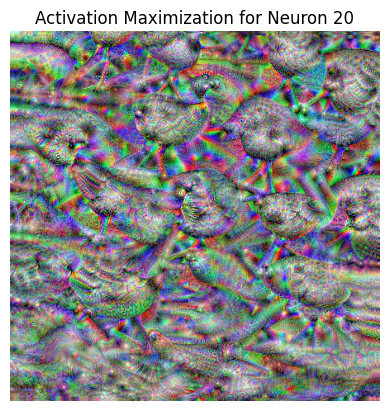

In [23]:
neuron_index = 20

# other indices to look at: 385: Indian elephant, 2: great white shark, 555: fire truck
# neuron_index = labels_names.index("Indian elephant")

activation_maximization = ActivationMaximization(model)
activation_maximization.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

**Assignment**: You might want to play with this, e.g. 385: Indian elephant, 2: great white shark, 555: fire truck

Other classes can be found at:
[ImageNet](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a)

Iteration 0/2000, Activation: 0.6036213040351868, TotalVar: 6.647691249847412, TotalVar: 0.6903645396232605
Iteration 100/2000, Activation: 11.785008430480957, TotalVar: 1.8075603246688843, TotalVar: 0.5619377493858337
Iteration 200/2000, Activation: 23.0040283203125, TotalVar: 1.4976309537887573, TotalVar: 0.5520930290222168
Iteration 300/2000, Activation: 27.24361801147461, TotalVar: 1.3435893058776855, TotalVar: 0.5481520295143127
Iteration 400/2000, Activation: 83.78118896484375, TotalVar: 1.150743842124939, TotalVar: 0.5432751178741455
Iteration 500/2000, Activation: 115.4874496459961, TotalVar: 1.1666553020477295, TotalVar: 0.5454331636428833
Iteration 600/2000, Activation: 154.65298461914062, TotalVar: 1.122355341911316, TotalVar: 0.5462686419487
Iteration 700/2000, Activation: 131.28736877441406, TotalVar: 1.0168442726135254, TotalVar: 0.5426697731018066
Iteration 800/2000, Activation: 240.6665802001953, TotalVar: 0.9360289573669434, TotalVar: 0.5418781638145447
Iteration 900/2

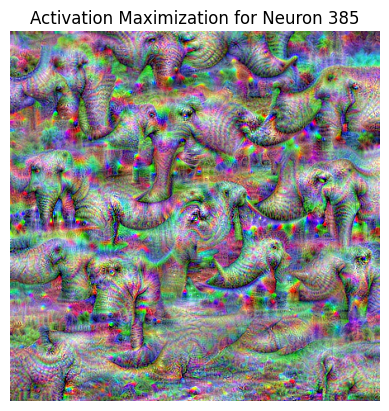

In [24]:
neuron_index = 385
neuron_index = labels_names.index("Indian elephant")
activation_maximization = ActivationMaximization(model)
activation_maximization.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

Iteration 0/2000, Activation: -1.3124885559082031, TotalVar: 6.401766777038574, TotalVar: 0.6734634041786194
Iteration 100/2000, Activation: 5.380183219909668, TotalVar: 1.4443057775497437, TotalVar: 0.5473459959030151
Iteration 200/2000, Activation: 10.252066612243652, TotalVar: 1.2790896892547607, TotalVar: 0.5411438345909119
Iteration 300/2000, Activation: 14.589106559753418, TotalVar: 1.232911229133606, TotalVar: 0.536146879196167
Iteration 400/2000, Activation: 17.685821533203125, TotalVar: 1.198360800743103, TotalVar: 0.5363912582397461
Iteration 500/2000, Activation: 47.524391174316406, TotalVar: 1.066823959350586, TotalVar: 0.5340797901153564
Iteration 600/2000, Activation: 57.29697036743164, TotalVar: 1.0676422119140625, TotalVar: 0.5353348851203918
Iteration 700/2000, Activation: 43.90217590332031, TotalVar: 1.0994795560836792, TotalVar: 0.536135196685791
Iteration 800/2000, Activation: 64.62744140625, TotalVar: 1.0022118091583252, TotalVar: 0.5298776030540466
Iteration 900/2

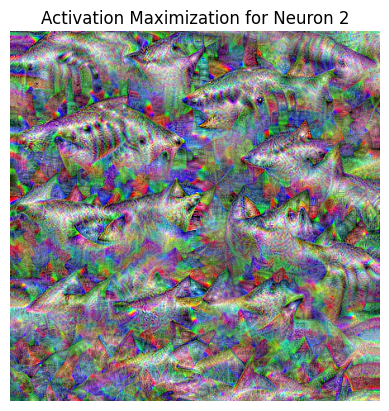

In [25]:
neuron_index = 2
neuron_index = labels_names.index("great white shark")
activation_maximization = ActivationMaximization(model)
activation_maximization.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

Iteration 0/2000, Activation: -0.24537822604179382, TotalVar: 7.233919620513916, TotalVar: 0.7263684868812561
Iteration 100/2000, Activation: 5.82099723815918, TotalVar: 1.505923867225647, TotalVar: 0.5504295229911804
Iteration 200/2000, Activation: 9.756240844726562, TotalVar: 1.390882134437561, TotalVar: 0.5460066199302673
Iteration 300/2000, Activation: 18.845558166503906, TotalVar: 1.4229114055633545, TotalVar: 0.5456190705299377
Iteration 400/2000, Activation: 44.130916595458984, TotalVar: 1.0928581953048706, TotalVar: 0.5331703424453735
Iteration 500/2000, Activation: 52.87211990356445, TotalVar: 1.0484399795532227, TotalVar: 0.5328567028045654
Iteration 600/2000, Activation: 55.62382125854492, TotalVar: 1.0770572423934937, TotalVar: 0.5322012901306152
Iteration 700/2000, Activation: 87.68729400634766, TotalVar: 1.089585542678833, TotalVar: 0.5321005582809448
Iteration 800/2000, Activation: 85.2635726928711, TotalVar: 0.9556010961532593, TotalVar: 0.5287529826164246
Iteration 900

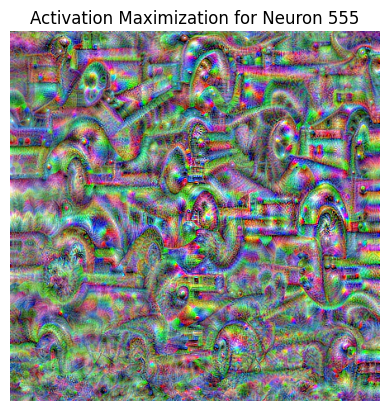

In [27]:
neuron_index = 555
# neuron_index = labels_names.index("fire truck")
activation_maximization = ActivationMaximization(model)
activation_maximization.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

**Assignment:** Generate the activation maximization image the the same index, for a network initialized randomly. What do you observe?

Iteration 0/2000, Activation: -0.05832690745592117, TotalVar: 6.182568073272705, TotalVar: 0.6588356494903564
Iteration 100/2000, Activation: 0.046800270676612854, TotalVar: 1.2069659233093262, TotalVar: 0.4737747311592102
Iteration 200/2000, Activation: 0.09367480874061584, TotalVar: 0.8838109970092773, TotalVar: 0.41082707047462463
Iteration 300/2000, Activation: 0.05916046351194382, TotalVar: 0.7778571844100952, TotalVar: 0.34459567070007324
Iteration 400/2000, Activation: 0.08064495027065277, TotalVar: 0.5568329095840454, TotalVar: 0.28177234530448914
Iteration 500/2000, Activation: 0.06371456384658813, TotalVar: 0.6909822821617126, TotalVar: 0.2254597544670105
Iteration 600/2000, Activation: 0.023201659321784973, TotalVar: 0.38957083225250244, TotalVar: 0.17586684226989746
Iteration 700/2000, Activation: 0.026502368971705437, TotalVar: 0.38143670558929443, TotalVar: 0.15442080795764923
Iteration 800/2000, Activation: 0.03719230741262436, TotalVar: 0.397013396024704, TotalVar: 0.15

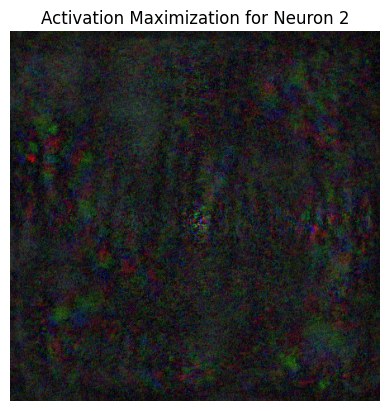

In [28]:
neuron_index = 2
rand_model = models.vgg16(weights=None).eval().to(device)
activation_max_random = ActivationMaximization(rand_model)
activation_max_random.visualize(neuron_index, num_iterations=2000, input_shape=(448, 448))

As you can see, in the trained neurons the activation maximization image shows repetitive shapes of the class-specific features. For example, for the shark class, the activation maximization image shows distinct shapes that clearly resemble the features related to the shark class. This happens because the pretrained network has learned meaningful patterns in deeper layers.

In contrast when I generated the activation maximization image for the same neuron index but using a randomly initialized network, the result looked completely different. The visualization from the random network mostly shows random noise and scattered colors without any recognizable structure or pattern. This makes sense because the network didn't learn anything yet and its filters and weights are just random numbers, so there are no meaningful features for the optimization to enhance.

# Bonus: Visualizing Attention of a ViT Model

The attention mechanism in Vision Transformers (ViT) allows the model to focus on different parts of the input image. The attention weights can be interpreted as a matrix that indicates how much focus the model puts on each part of the image when making predictions.

### Mathematical Formulation

Let $ A $ be the attention matrix derived from the self-attention mechanism of a transformer layer, where:

$$
A = \text{Softmax}\left(\frac{QK^T}{\sqrt{d_k}}\right)
$$

- $Q$ is the query matrix,
- $K$ is the key matrix,
- $d_k$ is the dimensionality of the keys.

The output of the attention layer is simply the dot product $AV$, where $V$ is the value matrix.


In [ ]:
import cv2
from transformers import ViTForImageClassification, ViTFeatureExtractor

In [ ]:
# Load the ViT model and feature extractor
model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
feature_extractor = ViTFeatureExtractor.from_pretrained('google/vit-base-patch16-224')
model.config.output_attentions = True

In [ ]:
# Load and prepare the image
image_path = './imagenet/418657219_3567961db1.jpg'
image = Image.open(image_path)
inputs = feature_extractor(images=image, return_tensors="pt")

# Pass the image through the model
outputs = model(**inputs)

In [ ]:
# Extract attention weights
attn_weights = outputs.attentions
attn_weights = torch.stack(attn_weights).squeeze(1)
attn_weights = torch.mean(attn_weights, dim=1) # Average across attention heads in Multi-attention Layers

# Check the shape of the attention weights
print("Shape of attention weights:", attn_weights.shape) # The model is composed of 12 Attention Layers

### Attention Rollout Process

To visualize the contributions of different layers to the final output, we perform an attention rollout.
At every Transformer block, we get an attention Matrix $(A)_{ij}$ that defines how much attention is going to flow from token j in the previous layer to token i in the next layer.
Attention rollout process involves recursively multiplying the attention matrices across multiple layers.
To account for the residual connections, we can add the identity matrix $I$ to the Attention matrices: $A + I$.

Let $A^{l}$ be the attention matrix from layer $l$. The rollout $R$ at layer $l$ is computed as follows:

1. Initialize $R^{0}$ as the attention matrix of the first layer:
   $$
   R^{0} = A^{0}
   $$

2. For each following layer $l$:
   $$
   R^{l} = (A^{l} + I) R^{l-1}
   $$
where $I$ is the Identity matrix.

Let $L$ denotes the index of the last layer. The final rollout $R^{L}_{0}$ can be interpreted as a joint attention representation that indicates how each token attends to every other token throughout the network.

$R^{L}$ can be normalized to obtain a mask:

$$
\text{mask} = \frac{R^{L}_{0}}{\max(R^{L}_{0})}
$$



In [ ]:
# Add an identity matrix for bias
residual_att = torch.eye(attn_weights.size(1))
aug_att_mat = attn_weights + residual_att
aug_att_mat = aug_att_mat / aug_att_mat.sum(dim=-1).unsqueeze(-1)

# Recursively multiply the weight matrices
rollout_attentions = torch.zeros(aug_att_mat.size())
rollout_attentions[0] = aug_att_mat[0]
for n in range(1, aug_att_mat.size(0)):
    rollout_attentions[n] = torch.matmul(aug_att_mat[n], rollout_attentions[n-1])

# Attention from the output to the input space
R = rollout_attentions[-1]
grid_size = int(np.sqrt(aug_att_mat.size(-1)))
mask = R[0, 1:].reshape(grid_size, grid_size).detach().numpy()
mask = cv2.resize(mask / mask.max(), image.size)[..., np.newaxis]


In [ ]:
# Resize the CAM and overlay it
result = overlay_mask(image, to_pil_image(mask, mode='F'), alpha=0.5)
# Display it
plt.imshow(result); plt.axis('off'); plt.tight_layout(); plt.show()

**Assignment:** The attention rollout mechanism in ViTs is not class-specific. Could you propose a modification of this mechanism to make it class-specific, drawing inspiration from methods like Grad-CAM?